In [1]:
from i308_calib import *
from i308_utils import *
import cv2
import pickle
import sys
import os
import matplotlib.pyplot as plt
# import stereodemo
import numpy as np
import open3d as o3d

sys.path.append(os.path.abspath(os.path.join("..", "src")))
from utils import *
from rectification_funcs import *
from pnp_funcs import *
from disparity_funcs import *
from reconstruct_funcs import *

%load_ext autoreload
%autoreload 2

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [2]:
path = "../datasets/own_data/stereo_calibration.pkl"
with open(path, "rb") as f:
    calibration_results = pickle.load(f)

In [3]:
path = "../datasets/own_data/stereo_maps.pkl"
with open(path, "rb") as f:
    rectification_results = pickle.load(f)

In [4]:
print(calibration_results.keys())
print(rectification_results.keys())

dict_keys(['left_K', 'left_dist', 'right_K', 'right_dist', 'R', 'T', 'E', 'F', 'image_size'])
dict_keys(['left_map_x', 'left_map_y', 'right_map_x', 'right_map_y', 'R1', 'R2', 'P1', 'P2', 'Q', 'validRoi1', 'validRoi2'])


In [5]:
print_calib_info(calibration_results)

# STEREO CALIBRATION
# Left camera Intrinsics:
left_K = np.array([
	[   394.622,	     0.000,	   622.070],
	[     0.000,	   392.434,	   344.987],
	[     0.000,	     0.000,	     1.000]
])

left_dist = np.array([
	[ -0.004330,	 -0.017318,	 -0.001853,	 -0.000482,	  0.001402]
])

# Right camera Intrinsics:
right_K = np.array([
	[   394.624,	     0.000,	   647.731],
	[     0.000,	   392.879,	   340.414],
	[     0.000,	     0.000,	     1.000]
])

right_dist = np.array([
	[  0.003689,	 -0.025733,	 -0.000658,	 -0.000814,	  0.004254]
])

# Rotation:
R = np.array([
	[     1.000,	     0.001,	     0.005],
	[    -0.001,	     1.000,	    -0.002],
	[    -0.005,	     0.002,	     1.000]
])

# Translation:
T = np.array([
	[-59.720987],
	[ -0.101538],
	[  0.395911]
])

# Essential Matrix:
E = np.array([
	[     0.001,	    -0.396,	    -0.101],
	[     0.071,	     0.091,	    59.722],
	[     0.189,	   -59.721,	     0.091]
])

# Fundamental Matrix:
F = np.array([
	[     0.000,	    -0.000,	     0.002],
	[     0.0

In [6]:
print_rect_info(rectification_results)

# STEREO RECTIFICATION
# Left camera Rectification:
R1 = np.array([
	[     1.000,	     0.003,	    -0.001],
	[    -0.003,	     1.000,	    -0.001],
	[     0.001,	     0.001,	     1.000]
])

P1 = np.array([
	[   396.886,	     0.000,	   637.306,	     0.000],
	[     0.000,	   396.886,	   346.361,	     0.000],
	[     0.000,	     0.000,	     1.000,	     0.000]
])

validRoi1 = (0, 0, 1280, 720)

# Right camera Rectification:
R2 = np.array([
	[     1.000,	     0.002,	    -0.007],
	[    -0.002,	     1.000,	     0.001],
	[     0.007,	    -0.001,	     1.000]
])

P2 = np.array([
	[   396.886,	     0.000,	   637.306,	-23702.991],
	[     0.000,	   396.886,	   346.361,	     0.000],
	[     0.000,	     0.000,	     1.000,	     0.000]
])

validRoi2 = (0, 0, 1280, 720)

# Disparity-to-depth mapping matrix Q:
Q = np.array([
	[     1.000,	     0.000,	     0.000,	  -637.306],
	[     0.000,	     1.000,	     0.000,	  -346.361],
	[     0.000,	     0.000,	     0.000,	   396.886],
	[     0.000,	     0.000,	     0.

In [7]:
images_path = "../datasets/own_data/sarf/captures"
prefix = ""
ext = "jpg"
print_info = True
left_images, right_images = get_images(images_path, prefix, ext, print_info)

Found 7 left images and 7 right images
First left image: ..\datasets\own_data\sarf\captures\left_19.jpg
First right image: ..\datasets\own_data\sarf\captures\right_19.jpg


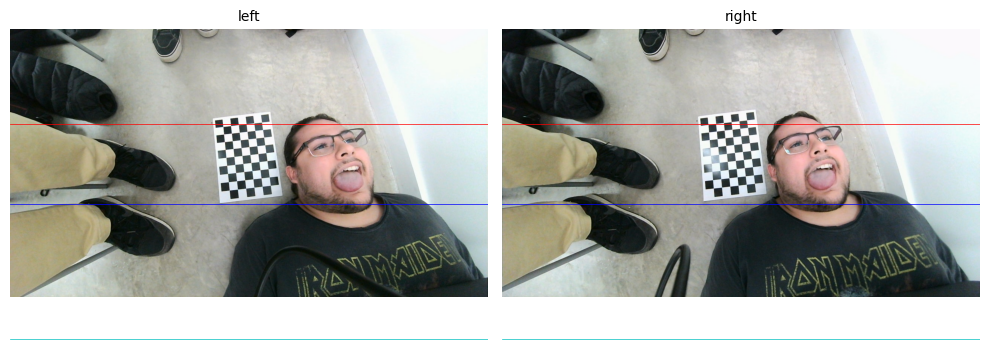

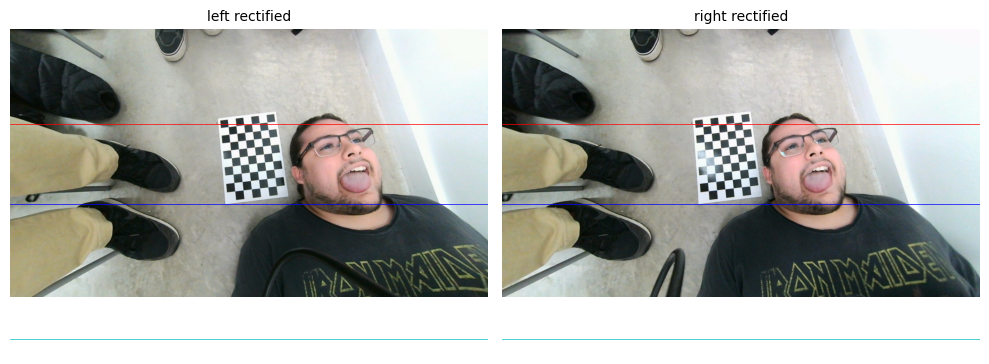

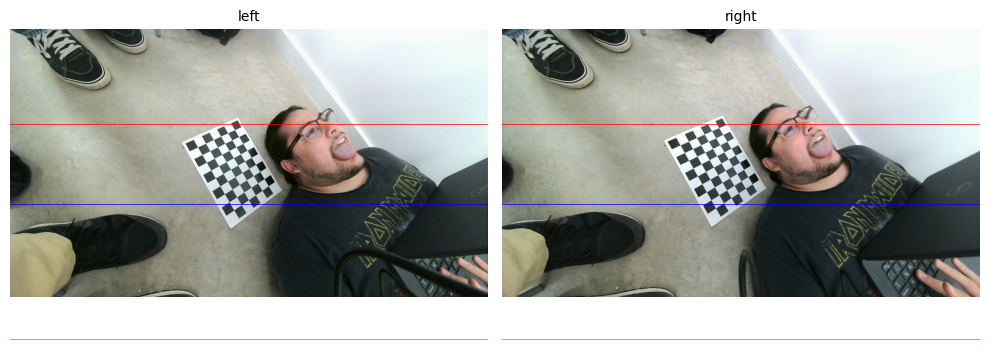

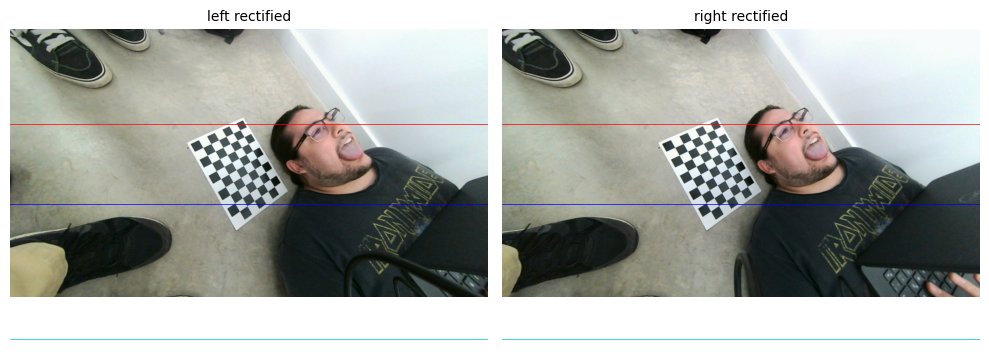

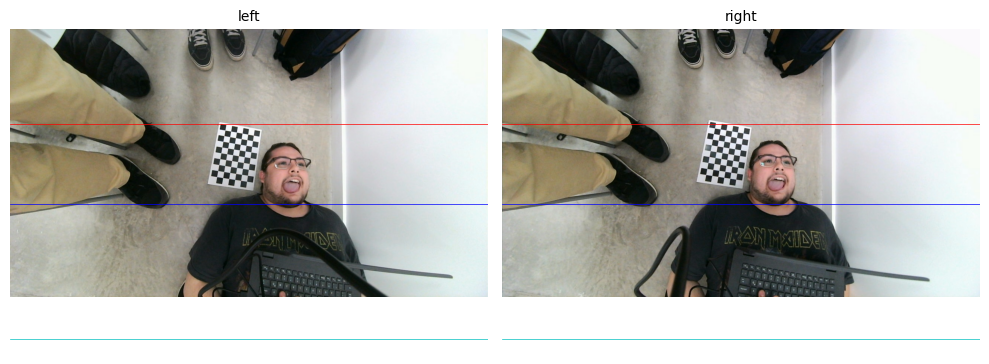

...

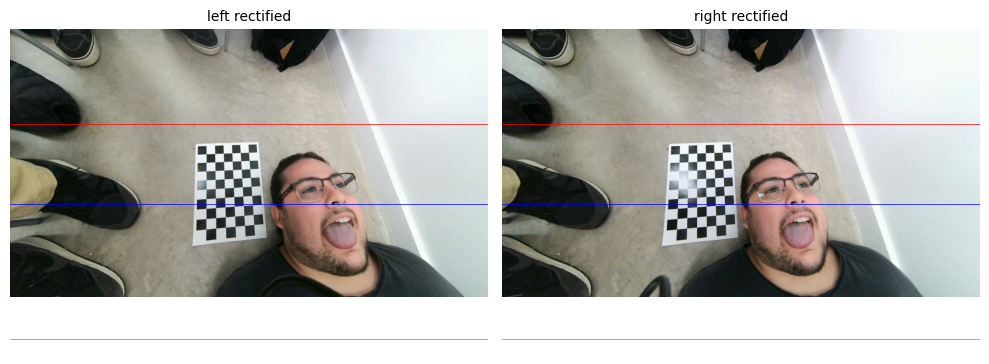

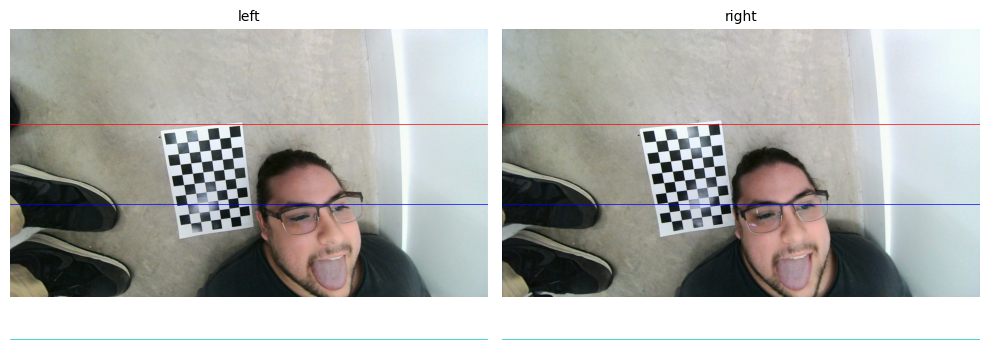

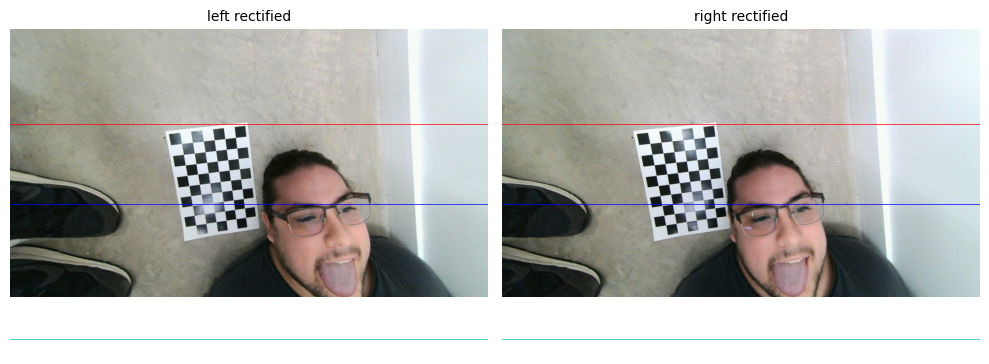

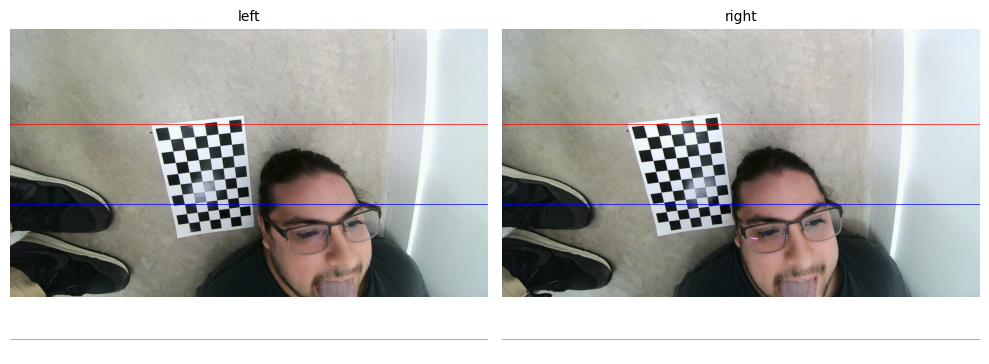

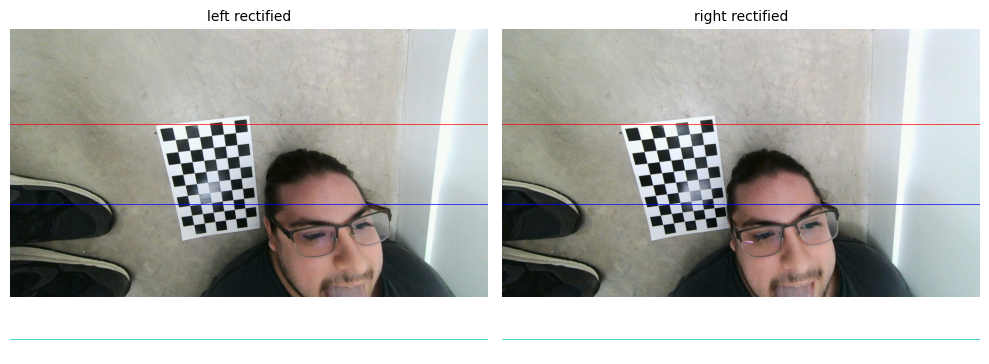

In [8]:
left_rectified_images, right_rectified_images = rectify_images(left_images, right_images, rectification_results, show=True)

In [7]:
disparities = get_disparity_images(left_rectified_images, right_rectified_images, calibration_results)

C:\Users\Lucio\.cache\stereodemo\models\crestereo_combined_iter10_720x1280.onnx
C:\Users\Lucio\.cache\stereodemo\models\crestereo_combined_iter10_720x1280.onnx
C:\Users\Lucio\.cache\stereodemo\models\crestereo_combined_iter10_720x1280.onnx
C:\Users\Lucio\.cache\stereodemo\models\crestereo_combined_iter10_720x1280.onnx
C:\Users\Lucio\.cache\stereodemo\models\crestereo_combined_iter10_720x1280.onnx
C:\Users\Lucio\.cache\stereodemo\models\crestereo_combined_iter10_720x1280.onnx
C:\Users\Lucio\.cache\stereodemo\models\crestereo_combined_iter10_720x1280.onnx


In [8]:
path = "../datasets/own_data/sarf/sarf_disparities.pkl"
write_pickle(path, disparities)

'..\\datasets\\own_data\\sarf\\sarf_disparities.pkl'

In [9]:
path = "../datasets/own_data/sarf/sarf_disparities.pkl"
with open(path, "rb") as f:
    disparities = pickle.load(f)

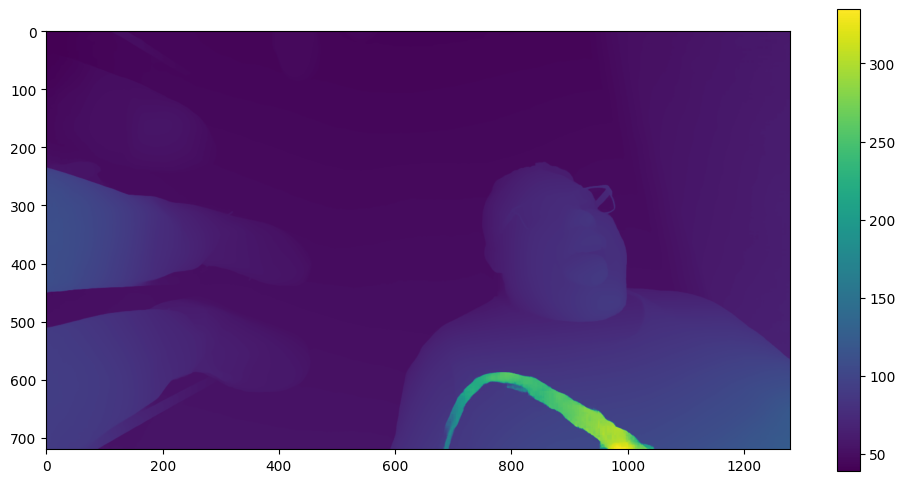

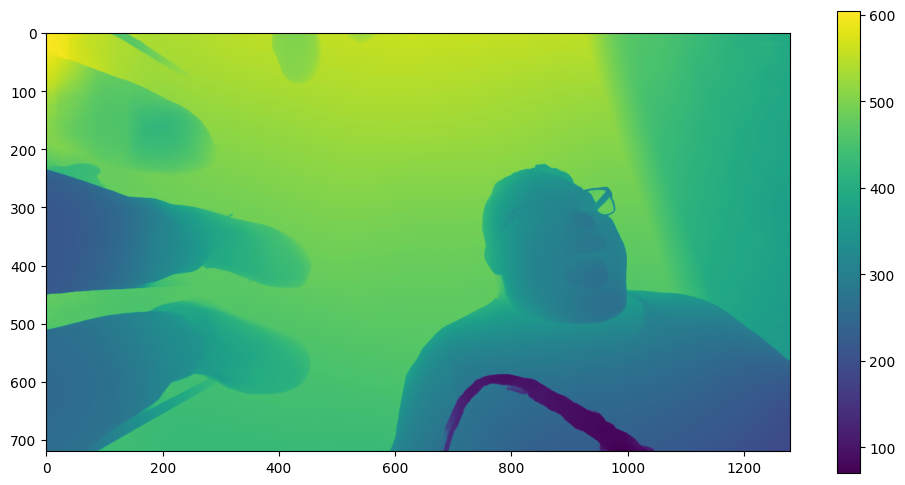

In [10]:
#show first disparity and depth
disparity = disparities[0]
plt.figure(figsize=(12, 6))
plt.imshow(disparity)
plt.colorbar()
plt.show()

left_K = calibration_results["left_K"]
T = calibration_results["T"]
f = left_K[0][0]
B = np.linalg.norm(T) 

depth = compute_depth(disparity, f, B)
plt.figure(figsize=(12, 6))
plt.imshow(depth)
plt.colorbar()
plt.show()

left corners found for image 1: True


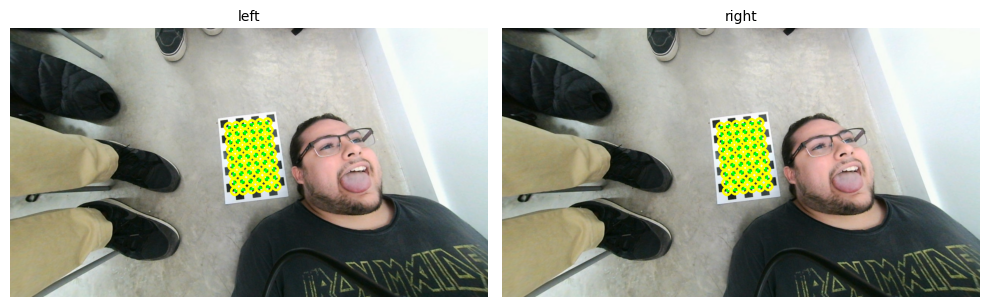

left corners found for image 2: True


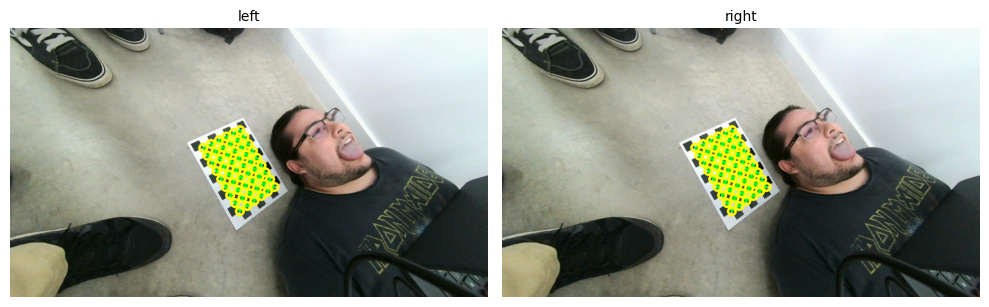

left corners found for image 3: True


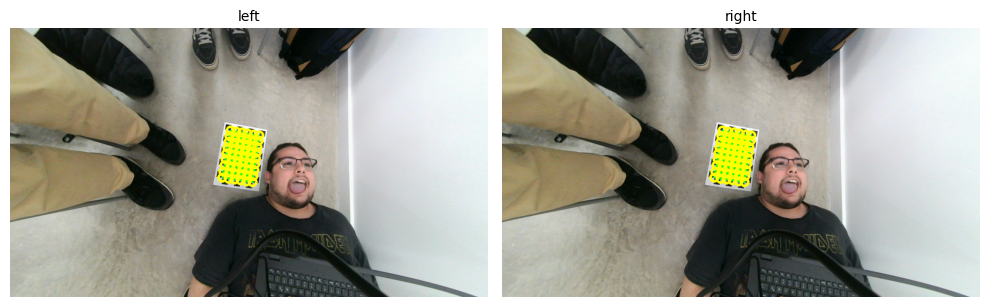

left corners found for image 4: True


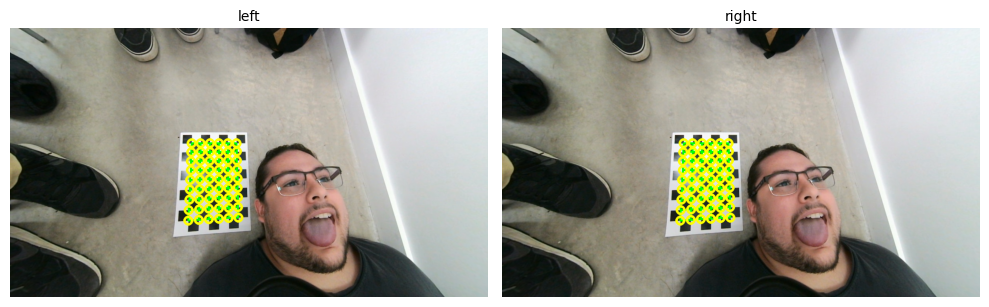

left corners found for image 5: True


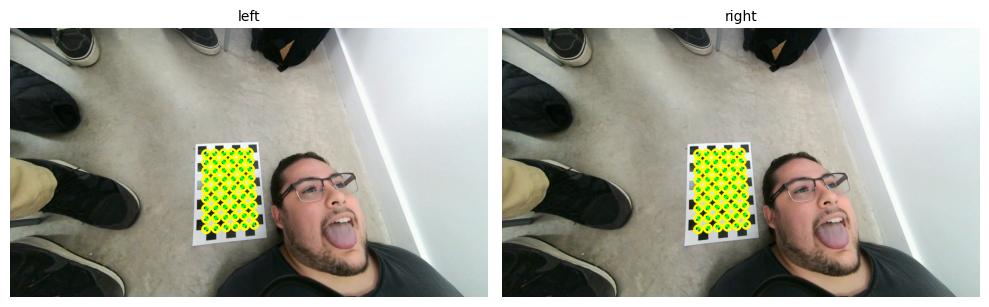

left corners found for image 6: True


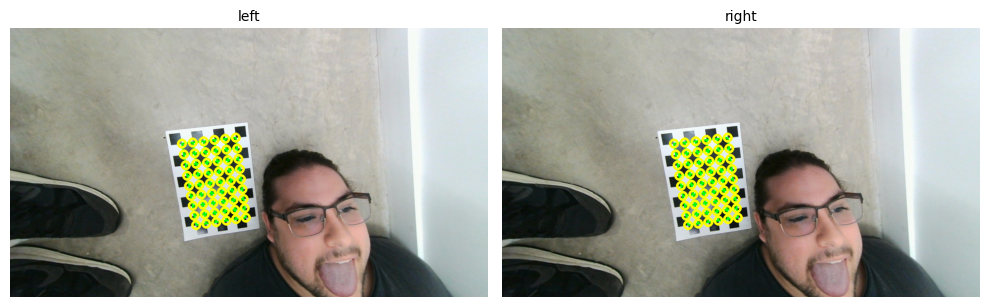

left corners found for image 7: True


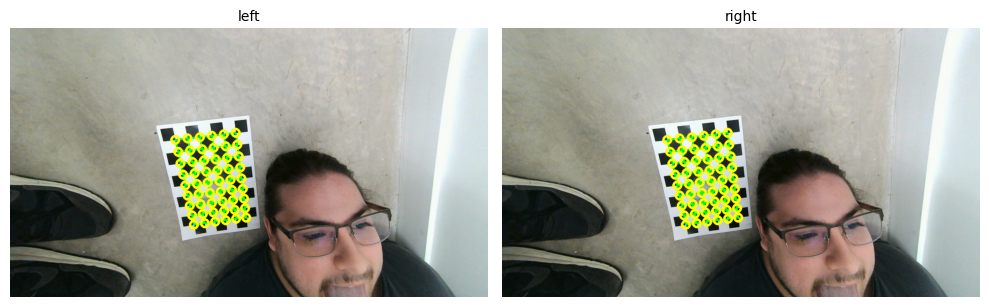

In [10]:
checkerboard_path = "../datasets/own_data/checkerboard.txt"
poses = get_poses(left_rectified_images, calibration_results, checkerboard_path, True, True)

In [11]:
extent = np.array([800, 600, 550])
nbn = 30
std = 1.5
scene, pcds = reconstruct(left_rectified_images, disparities, poses, rectification_results, extent, nbn, std)

In [13]:
path = "../datasets/own_data/sarf/point_clouds/sarf_unaligned.ply"
o3d.io.write_point_cloud(path, scene)

True

In [12]:
source = pcds[1]
target = pcds[0]
transformation = np.eye(4)
save_path = "../datasets/own_data/sarf/point_clouds/2_sarf_clouds_unaligned.ply"
draw_registration_result(source, target, transformation, show=False, save_path=save_path)

In [15]:
scene_aligned, aligned_pcds, transformations = align_pcds(pcds, np.eye(4), threshold = 2, radius = 0.2, max_nn = 50, k =50)

Apply point-to-plane ICP to 1
RegistrationResult with fitness=4.386609e-01, inlier_rmse=1.137881e+00, and correspondence_set size of 183498
Access transformation to get result.
Transformation is:
[[ 9.91423406e-01  2.33004526e-03  1.30668286e-01  7.37446110e-01]
 [ 5.09020808e-03  9.98393910e-01 -5.64242072e-02 -4.01358826e-01]
 [-1.30589892e-01  5.66054085e-02  9.89819230e-01  8.00036301e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
Apply point-to-plane ICP to 2
RegistrationResult with fitness=4.638282e-01, inlier_rmse=1.136913e+00, and correspondence_set size of 84625
Access transformation to get result.
Transformation is:
[[ 9.98880121e-01  2.67293819e-05  4.73128252e-02  7.09707847e-02]
 [-1.26621073e-04  9.99997770e-01  2.10830678e-03  4.69700694e-03]
 [-4.73126633e-02 -2.11193653e-03  9.98877896e-01  1.20611579e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
Apply point-to-plane ICP to 3
RegistrationResult with fitness=5.734060e

In [ ]:
source = pcds[1]
target = pcds[0]
transformation = transformations[0]
save_path = "../datasets/own_data/sarf/point_clouds/2_sarf_clouds_aligned.ply"
draw_registration_result(source, target, transformation, show=False, save_path=save_path)

In [17]:
path = "../datasets/own_data/sarf/point_clouds/sarf_scene_aligned.ply"
o3d.io.write_point_cloud(path, scene_aligned)

True

In [18]:
min_bound = np.array([10, -210, -260])
max_bound = np.array([250, -8, -170])  
box = o3d.geometry.AxisAlignedBoundingBox(min_bound, max_bound)
box.color = (1, 0, 0)

In [19]:
box_face = o3d.geometry.AxisAlignedBoundingBox(min_bound, max_bound)

indices_in_box = box_face.get_point_indices_within_bounding_box(scene.points)
pcd_body = scene.select_by_index(indices_in_box, invert=True)
pcd_face = scene.select_by_index(indices_in_box)

In [20]:
voxel_size = 2
pcd_down = pcd_face.voxel_down_sample(voxel_size=voxel_size)
mesh_pivoting = create_mesh_from_point_cloud(pcd_down, voxel_size, max_nn=30, k=30, method="pivoting")

computing mesh using ball pivoting...


In [21]:
voxel_size = 2
pcd_down = pcd_body.voxel_down_sample(voxel_size=voxel_size)
mesh_poisson = create_mesh_from_point_cloud(pcd_down, voxel_size, max_nn=30, k=30, depth=13, scale=1, linear_fit=False, method="poisson")

computing mesh using poisson reconstruction...


In [22]:
final_sarf = mesh_poisson + mesh_pivoting

In [23]:
path = "../datasets/own_data/sarf/meshes/sarf_mesh.ply"
o3d.io.write_triangle_mesh(path, final_sarf)

True